In [ ]:
!curl -L "https://public.roboflow.com/ds/vu0TmgEeUd?key=Tb9nOjo1Rg" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
 extracting: train/images/PUZZLE_OFFICE_H_B_frame_1075_jpg.rf.22f2a634d6d18f4b0770e5289b3e5599.jpg  
 extracting: train/images/PUZZLE_OFFICE_H_B_frame_1226_jpg.rf.db523819b065de035e53b42a031cd24e.jpg  
 extracting: train/images/PUZZLE_OFFICE_H_B_frame_1252_jpg.rf.f8ef6921a6c9d919d4f3c2d9678ba12c.jpg  
 extracting: train/images/PUZZLE_OFFICE_H_B_frame_1261_jpg.rf.0ac8c9df9aff7f164dbaf71e1d573205.jpg  
 extracting: train/images/PUZZLE_OFFICE_H_B_frame_1350_jpg.rf.af714e93df2fc997f15a0a4b394be469.jpg  
 extracting: train/images/PUZZLE_OFFICE_H_B_frame_1408_jpg.rf.18df765857d1c425661798e86cd346eb.jpg  
 extracting: train/images/PUZZLE_OFFICE_H_B_frame_1459_jpg.rf.4ed342e7de678b9f3cfa52fdc63c061e.jpg  
 extracting: train/images/PUZZLE_OFFICE_H_B_frame_1472_jpg.rf.f139fbfa4d0185d2a54c0f9e4f8b088c.jpg  
 extracting: train/images/PUZZLE_OFFICE_H_B_frame_1527_jpg.rf.01cfbdcf0362fe4dc7ceb3cff6628d1a.jpg  
 extracting: train/images/PUZZLE_OFFICE_H_B_frame_1556_

In [ ]:
%cd /content
!git clone https://github.com/ultralytics/yolov5.git

/content
Cloning into 'yolov5'...
remote: Enumerating objects: 16413, done.
remote: Counting objects: 100% (5/5), done.
remote: Compressing objects: 100% (5/5), done.
remote: Total 16413 (delta 0), reused 4 (delta 0), pack-reused 16408
Receiving objects: 100% (16413/16413), 14.95 MiB | 18.67 MiB/s, done.
Resolving deltas: 100% (11260/11260), done.


In [ ]:
%cd /content/yolov5/
!pip install -r requirements.txt

/content/yolov5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.4/196.4 kB 6.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 709.4/709.4 kB 15.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 9.5 MB/s eta 0:00:00


In [ ]:
%cat /content/dataset/data.yaml

train: ../train/images
val: ../valid/images

nc: 4
names: ['myleft', 'myright', 'yourleft', 'yourright']

In [ ]:
%cd /
from glob import glob

img_list = glob('/content/dataset/export/images/*.jpg')

print(len(img_list))

/
3840


In [ ]:
from sklearn.model_selection import train_test_split

train_img_list, val_img_list = train_test_split(img_list, test_size=0.2, random_state=2000)

print(len(train_img_list), len(val_img_list))

3072 768


In [ ]:
with open('/content/dataset/train.txt', 'w') as f:
  f.write('\n'.join(train_img_list) + '\n')

with open('/content/dataset/val.txt', 'w') as f:
  f.write('\n'.join(val_img_list) + '\n')

In [ ]:
import yaml

with open('/content/dataset/data.yaml', 'r') as f:
  data = yaml.full_load(f)

print(data)

data['train'] = '/content/dataset/train.txt'
data['val'] = '/content/dataset/val.txt'

with open('/content/dataset/data.yaml', 'w') as f:
  yaml.dump(data, f)

print(data)

{'train': '../train/images', 'val': '../valid/images', 'nc': 4, 'names': ['myleft', 'myright', 'yourleft', 'yourright']}
{'train': '/content/dataset/train.txt', 'val': '/content/dataset/val.txt', 'nc': 4, 'names': ['myleft', 'myright', 'yourleft', 'yourright']}


In [ ]:
%cd /content/dataset/yolov5

!python train.py --img 640 --batch 16 --epochs 40 --data /content/dataset/data.yaml --cfg ./models/yolov5n.yaml --weights yolov5n.pt --name gun_yolov5s_results

/content/dataset/yolov5
2024-02-08 01:23:18.263857: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-02-08 01:23:18.263935: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-02-08 01:23:18.265354: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5n.pt, cfg=./models/yolov5n.yaml, data=/content/dataset/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=60, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=None, image_weig

In [ ]:
!ls /content/dataset/yolov5/runs/train/gun_yolov5s_results3


confusion_matrix.png				    PR_curve.png	   val_batch0_pred.jpg
events.out.tfevents.1707195219.a08c915b3ee1.5328.0  R_curve.png		   val_batch1_labels.jpg
F1_curve.png					    results.csv		   val_batch1_pred.jpg
hyp.yaml					    results.png		   val_batch2_labels.jpg
labels_correlogram.jpg				    train_batch0.jpg	   val_batch2_pred.jpg
labels.jpg					    train_batch1.jpg	   weights
opt.yaml					    train_batch2.jpg
P_curve.png					    val_batch0_labels.jpg


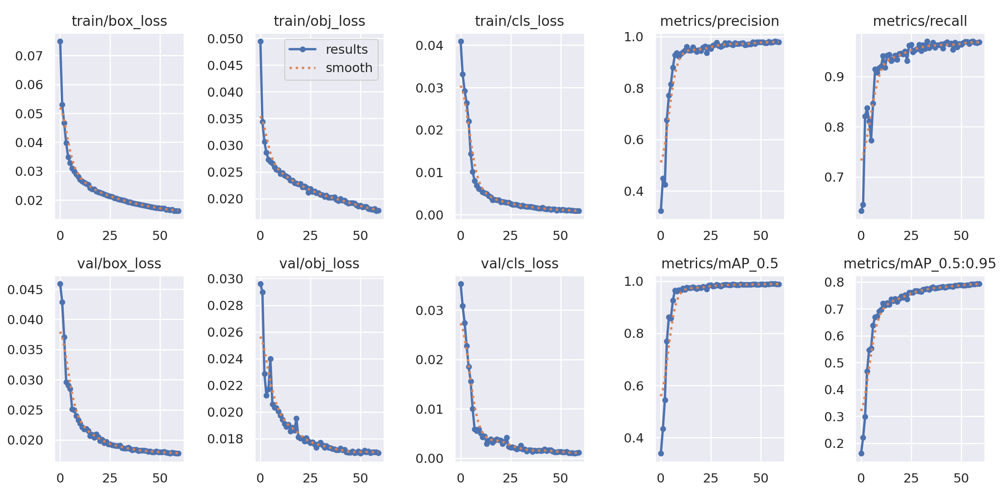

In [ ]:
from IPython.display import Image
Image(filename= '/content/dataset/yolov5/runs/train/gun_yolov5s_results3/results.png',width=1000)

Train 데이터

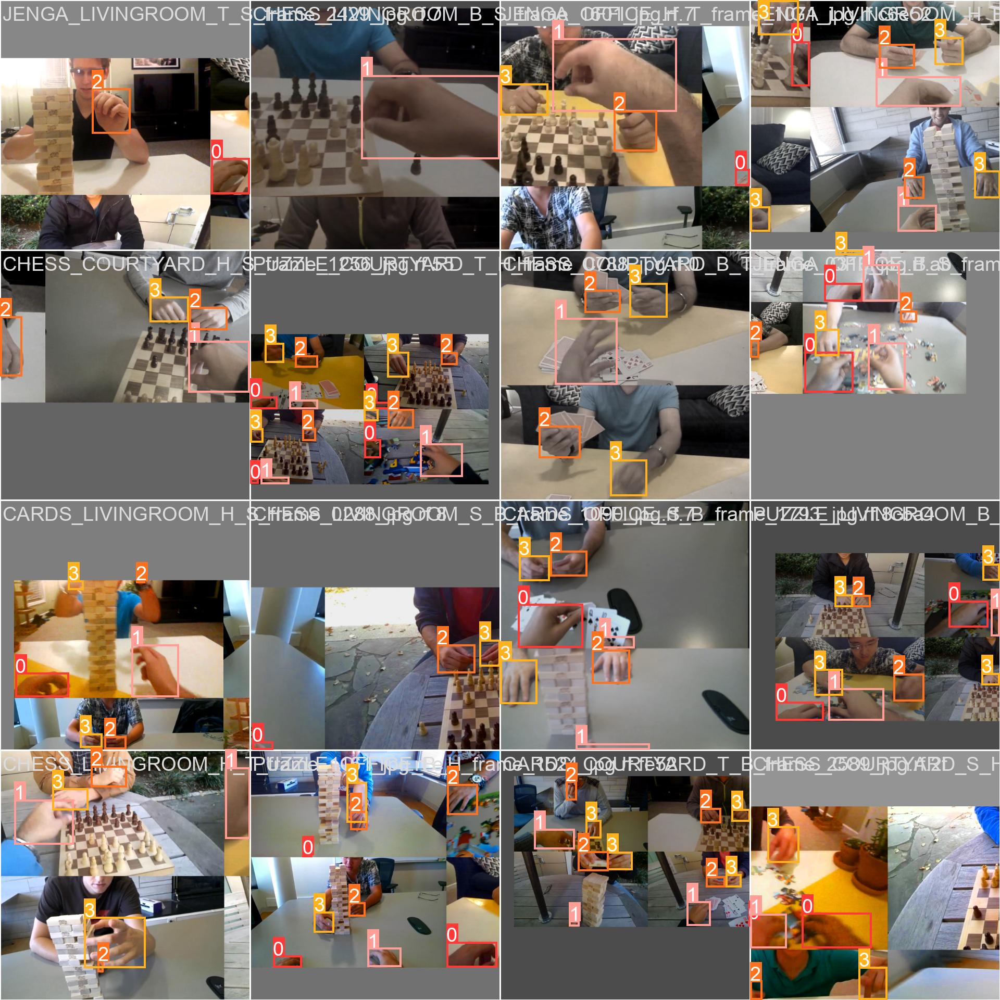

In [ ]:
Image(filename= '/content/dataset/yolov5/runs/train/gun_yolov5s_results3/train_batch0.jpg',width=1000)

검증

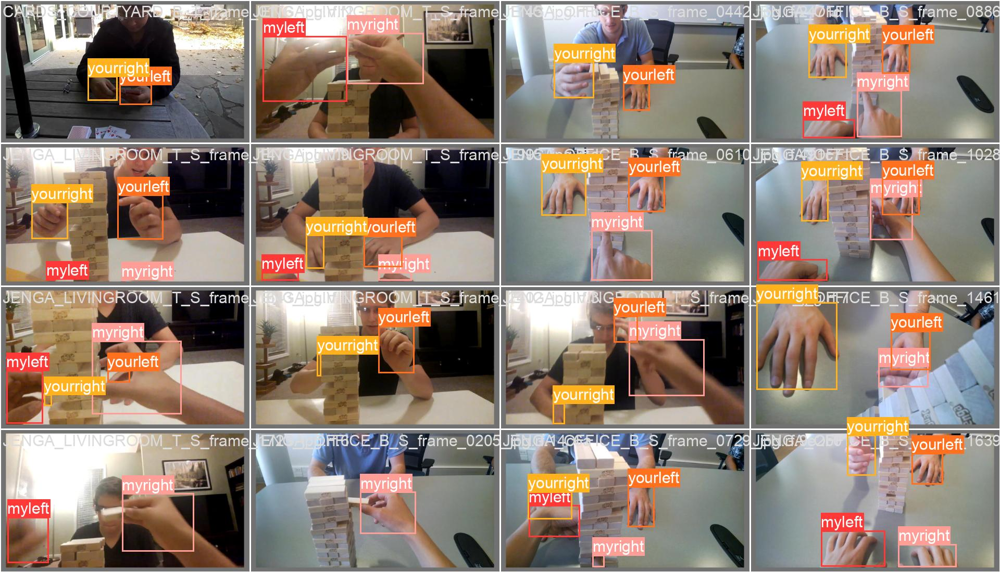

In [ ]:
Image(filename= '/content/dataset/yolov5/runs/train/gun_yolov5s_results3/val_batch0_labels.jpg',width=1000)

In [ ]:
%ls runs/train/gun_yolov5s_results3/weights

best.pt  last.pt


In [ ]:
%load_ext tensorboard
%tensorboard --logdir /content/yolov5/runs/

<IPython.core.display.Javascript object>

In [ ]:
from IPython.display import Image
import os

val_img_path = val_img_list[10]

!python detect.py --weights /content/yolov5/runs/train/gun_yolov5s_results/weights/best.pt --img 416 --conf 0.5 --source "{val_img_path}"

#Image(os.path.join('/content/yolov5/inference/output', os.path.basename(val_img_path)))

detect: weights=['/content/yolov5/runs/train/gun_yolov5s_results/weights/best.pt'], source=/content/dataset/export/images/CHESS_COURTYARD_B_T_frame_2603_jpg.rf.ed8ce51dfde80950f739150632f175d6.jpg, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-4-g7398d2d Python-3.7.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7020913 parameters, 0 gradients, 15.8 GFLOPs
image 1/1 /content/dataset/export/images/CHESS_COURTYARD_B_T_frame_2603_jpg.rf.ed8ce51dfde80950f739150632f175d6.jpg: 256x416 1 myright, 1 yourleft, 1 yourright, 15.5ms
Speed: 0.3ms pre-process, 15.5ms inference, 2.2ms NMS per ima

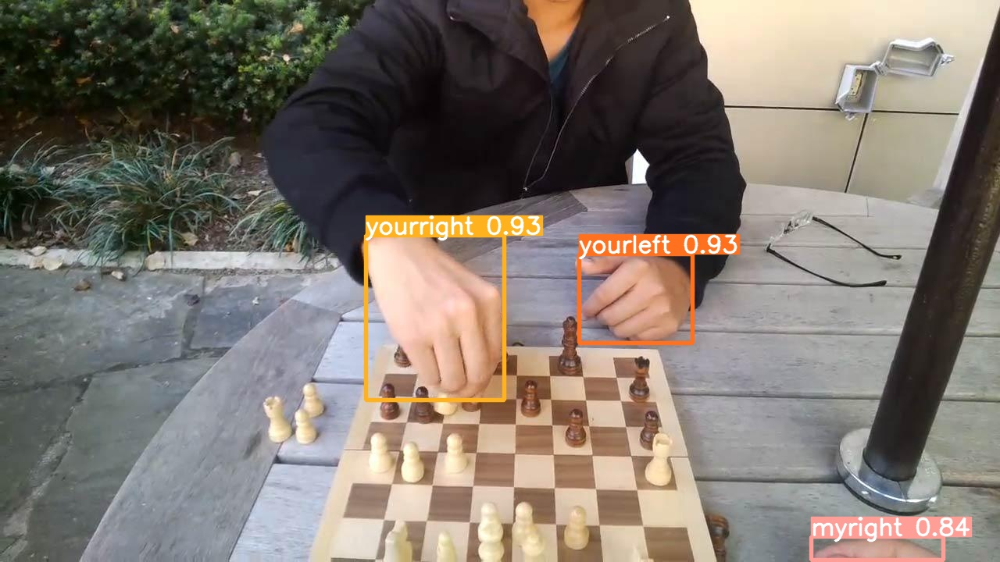

In [ ]:
Image(os.path.join('runs/detect/exp3', os.path.basename(val_img_path)))

In [ ]:
!python detect.py --weights /content/yolov5/runs/train/gun_yolov5s_results/weights/best.pt --img 416 --conf 0.5 --source "/content/handtest.mp4"

detect: weights=['/content/yolov5/runs/train/gun_yolov5s_results/weights/best.pt'], source=/content/handtest.mp4, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-4-g7398d2d Python-3.7.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7020913 parameters, 0 gradients, 15.8 GFLOPs
video 1/1 (1/318) /content/handtest.mp4: 256x416 2 myrights, 1 yourleft, 12.5ms
video 1/1 (2/318) /content/handtest.mp4: 256x416 2 myrights, 1 yourleft, 8.0ms
video 1/1 (3/318) /content/handtest.mp4: 256x416 1 myleft, 2 myrights, 1 yourleft, 7.6ms
video 1/1 (4/318) /content/handtest.mp4: 256x416 1 myleft, 1 myri